
## 6. ¿Podemos predecir el éxito de una criptomoneda?
**Integrantes**
> Mario Mallea y Maximiliano Ramírez.

**Descripción**
> La tarea en este caso consiste en predecir si una criptomoneda va a ser exitosa o no de acuerdo a sus características y comportamiento durante los primeros T períodos de tiempo.

**Dataset:**
> * Un compilado de 12 datasets con información histórica de diversas criptomonedas: https://www.kaggle.com/anasshahid88/crypto-market-data




<table align='left'>
<tr>
<td><img src='https://libertex.org/sites/default/files/inline-images/blog/1012501894.jpg' width='750'/> </td>
</tr>
</table>

**Motivación:** Una criptomoneda es un medio digital de intercambio que utiliza criptografía para asegurar las transacciones, controlar la creación de unidades adicionales y verificar la transferencia de activos usando tecnologías de registro distribuido y descentralizado.

Podríamos medir el éxito de una criptomoneda según dos aspectos diferentes: Primero naturalmente por su precio, pero por factores financieros sabemos que estos procesos estocásticos son altamente variables, en simples palabras dado que todo lo que sube tiene que bajar, por lo que las criptomonedas están reuniendo cada vez más inversores pero como el precio está sujeto a un alto riesgo esto lleva a que exista una fuga de inversores constantemente. Segundo, la capitilización del mercado osea el valor general de una criptomoneda en relación a su precio y la cantidad de transacciones que se generan con esta, en simples palabras este atributo indica que tan rica es una moneda considerando tanto su precio como su poder adquisitivo. Notar también que medir una criptomoneda o cualquier moneda descentralizada sería jugar un juego el cuál sabes que vas a perder puesto que los bancos centrales y gubernamentales tienen el monopolio del dinero y en cualquier momento podrían superar al bitcoin si lo desiasen.

En conlusión, similarmente a la historia de Linux como sistema operativo de código abierto, el éxito de una criptomoneda quedará marcado por aquella que todo el mundo utilice (mercado de capital) incluso sin saberlo y sin devualuar su propio valor en cada transacción (precio al alza).



**Nuestra propuesta:** Elaboraremos un ranking de las criptomonedas más éxitosas a través de métricas en función de las tendencias a predecir tanto del dinero como las transacciones generadas.

In [1]:
'''
pip install plotly==4.14.1
pip install xgboost
pip install nbconvert
'''

'\npip install plotly==4.14.1\npip install xgboost\npip install nbconvert\n'

In [2]:
## librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno 
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import LinearRegression
import xgboost
from xgboost.sklearn import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings("ignore")


In [3]:
#Datos de diferentes cripto-monedas

bitcoin_cash= pd.read_csv('CoinMarketData-bitcoin-cash.csv')
bitcoin= pd.read_csv('CoinMarketData-bitcoin.csv')
dash = pd.read_csv('CoinMarketData-dash.csv')
eos = pd.read_csv('CoinMarketData-eos.csv')
ethereum_classic = pd.read_csv('CoinMarketData-ethereum-classic.csv')
ethereum = pd.read_csv('CoinMarketData-ethereum.csv')
iota = pd.read_csv('CoinMarketData-iota.csv')
litecoin = pd.read_csv('CoinMarketData-litecoin.csv')
nano = pd.read_csv('CoinMarketData-nano.csv')
neo = pd.read_csv('CoinMarketData-neo.csv')
ripple = pd.read_csv('CoinMarketData-ripple.csv')
stellar = pd.read_csv('CoinMarketData-stellar.csv')
tron = pd.read_csv('CoinMarketData-tron.csv')
verge = pd.read_csv('CoinMarketData-verge.csv')

In [4]:
datasets= [bitcoin_cash, bitcoin, dash, eos, ethereum_classic, ethereum, iota, litecoin, nano,
           neo, ripple, stellar, tron, verge]
nombres= ['bitcoin_cash', 'bitcoin', 'dash', 'eos', 'ethereum_classic', 'ethereum', 'iota', 'litecoin', 'nano',
           'neo', 'ripple', 'stellar', 'tron', 'verge']

In [5]:
#Veamos las dimensiones de cada dataset

l=[]
j=0
for i in datasets:
    l.append(i.shape[0])
    j+=1

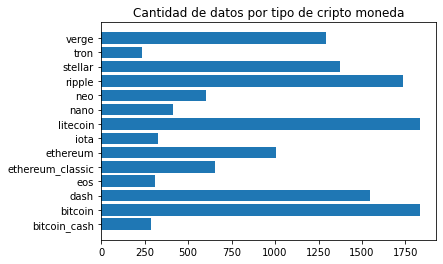

In [6]:
fig, ax = plt.subplots()
plt.barh(nombres, l)
plt.title('Cantidad de datos por tipo de cripto moneda')
plt.show()

existen criptomonedas más nuevas.

## Preprocesamiento Datasets 

In [7]:
#Cambiar el formato de las fechas a dd-mm-aa
import datetime

for moneda in datasets:
    moneda['Date'] = moneda['Date'].apply(lambda x: datetime.datetime.strptime(x, '%b %d, %Y'))

In [8]:
for moneda in datasets:
    for i in moneda.columns[1:]:
        l=[]
        for j in moneda[i]:
            if j=='-':
                l.append(0) ## reemplaza - por cero, usualmente criptomonedas sin mercado aun
            else:    
                l.append(float(str(j).replace(',', '')))
        moneda[i] = l

# Series de las criptomonedas 

### Open Price

In [9]:
j = 1
data = []
Traces = {
1 :'trace0',
2 :'trace1',
3 :'trace2',
 4 :'trace3',
5 :'trace4',
 6 :'trace5',
 7 :'trace6',
8 :'trace7',
9 :'trace8',
10 :'trace9',
11 :'trace10',
12 :'trace11',
13 : 'trace12',
14 : 'trace13'
}


for monedas in datasets:
     Traces[j] = go.Scatter(
         x = monedas['Date'] ,
         y = monedas['Open'],
         mode = 'lines',
         name = nombres[j-1]
     )
     data.append(Traces[j]) 
     j = j + 1

layout = go.Layout(
      xaxis=dict(title='Fechas'),
      yaxis=dict(title='Price$$'),
      title=('Tendecias cripto monedas'))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Close Price

In [10]:
j = 1
data = []
Traces = {
1 :'trace0',
2 :'trace1',
3 :'trace2',
 4 :'trace3',
5 :'trace4',
 6 :'trace5',
 7 :'trace6',
8 :'trace7',
9 :'trace8',
10 :'trace9',
11 :'trace10',
12 :'trace11',
13 : 'trace12',
14 : 'trace13'
}


for monedas in datasets:
     Traces[j] = go.Scatter(
         x = monedas['Date'] ,
         y = monedas['Close'],
         mode = 'lines',
         name = nombres[j-1]
     )
     data.append(Traces[j]) 
     j = j + 1

layout = go.Layout(
      xaxis=dict(title='Fechas'),
      yaxis=dict(title='Price$$'),
      title=('Tendecias cripto monedas'))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

### High Price

In [11]:
j = 1
data = []
Traces = {
1 :'trace0',
2 :'trace1',
3 :'trace2',
 4 :'trace3',
5 :'trace4',
 6 :'trace5',
 7 :'trace6',
8 :'trace7',
9 :'trace8',
10 :'trace9',
11 :'trace10',
12 :'trace11',
13 : 'trace12',
14 : 'trace13'
}


for monedas in datasets:
     Traces[j] = go.Scatter(
         x = monedas['Date'] ,
         y = monedas['High'],
         mode = 'lines',
         name = nombres[j-1]
     )
     data.append(Traces[j]) 
     j = j + 1

layout = go.Layout(
      xaxis=dict(title='Fechas'),
      yaxis=dict(title='Price$$'),
      title=('Tendecias cripto monedas'))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Low Price

In [12]:
j = 1
data = []
Traces = {
1 :'trace0',
2 :'trace1',
3 :'trace2',
 4 :'trace3',
5 :'trace4',
 6 :'trace5',
 7 :'trace6',
8 :'trace7',
9 :'trace8',
10 :'trace9',
11 :'trace10',
12 :'trace11',
13 : 'trace12',
14 : 'trace13'
}


for monedas in datasets:
     Traces[j] = go.Scatter(
         x = monedas['Date'] ,
         y = monedas['Low'],
         mode = 'lines',
         name = nombres[j-1]
     )
     data.append(Traces[j]) 
     j = j + 1

layout = go.Layout(
      xaxis=dict(title='Fechas'),
      yaxis=dict(title='Price$$'),
      title=('Tendecias cripto monedas'))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Volume

In [13]:
j = 1
data = []
Traces = {
1 :'trace0',
2 :'trace1',
3 :'trace2',
 4 :'trace3',
5 :'trace4',
 6 :'trace5',
 7 :'trace6',
8 :'trace7',
9 :'trace8',
10 :'trace9',
11 :'trace10',
12 :'trace11',
13 : 'trace12',
14 : 'trace13'
}


for monedas in datasets:
     Traces[j] = go.Scatter(
         x = monedas['Date'] ,
         y = monedas['Volume'],
         mode = 'lines',
         name = nombres[j-1]
     )
     data.append(Traces[j]) 
     j = j + 1

layout = go.Layout(
      xaxis=dict(title='Fechas'),
      yaxis=dict(title='Price$$'),
      title=('Tendecias cripto monedas'))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Market Cap

In [14]:
j = 1
data = []
Traces = {
1 :'trace0',
2 :'trace1',
3 :'trace2',
 4 :'trace3',
5 :'trace4',
 6 :'trace5',
 7 :'trace6',
8 :'trace7',
9 :'trace8',
10 :'trace9',
11 :'trace10',
12 :'trace11',
13 : 'trace12',
14 : 'trace13'
}


for monedas in datasets:
     Traces[j] = go.Scatter(
         x = monedas['Date'] ,
         y = monedas['Market Cap'],
         mode = 'lines',
         name = nombres[j-1]
     )
     data.append(Traces[j]) 
     j = j + 1

layout = go.Layout(
      xaxis=dict(title='Fechas'),
      yaxis=dict(title='Price$$'),
      title=('Tendecias cripto monedas'))
fig = go.Figure(data=data, layout=layout)
iplot(fig)

# Boosting model



In [15]:
model=XGBRegressor(objective="reg:linear", random_state=42)

# Random Forest


In [16]:
model= RandomForestRegressor(max_depth=5, random_state=0, bootstrap=True, n_estimators=1000, criterion='mse')

# Predicciones del último mes dada la información historia

La siguiente función predice cierto atributo para una cierta criptomoneda a través del modelo definido arriba.

In [17]:
def graficar(cripto_moneda, col, model):
    
    datos= datasets[nombres.index(cripto_moneda)]
    
    #Preprocesamiento
    datos= datos.sort_values("Date").reset_index(drop=True)
    
    train,test=datos.drop("Date",axis=1).iloc[:-30], datos.drop("Date",axis=1).iloc[-30:]
    X_train,Y_train= train.drop(col,axis=1), train[col]
    X_test,Y_test= test.drop(col,axis=1), test[col]

    
    #Entrenamiento
    
    model.fit(X_train, Y_train)
    y_pred = model.predict(X_test)
    
    mse=mean_squared_error(Y_test, y_pred)
    print("El mse para el modelo es: ", np.sqrt(mse))
    
    Traces = {
    1 :'trace0',
    2 :'trace1',
    3 :'trace2'
    }

    data=[]
    Traces[0] = go.Scatter(
             x = datos['Date'] ,
             y = datos[col],
             mode = 'lines',
             name = "Real"
         )
    data.append(Traces[0]) 

    Traces[1] = go.Scatter(
             x =datos['Date'][-30:].sort_values() ,
             y = y_pred,
             mode = 'lines',
             name = "Predicho"
         )
    data.append(Traces[1]) 
    
    Traces[2] = go.Scatter(
             x =datos['Date'],
             y = [datos[col][:-30].mean() for i in range(datos['Date'].shape[0])],
             mode = 'lines',
             name = "Promedio histórico"
         )
    data.append(Traces[2]) 

    layout = go.Layout(
          xaxis=dict(title='Fechas'),
          yaxis=dict(title='Price$$'),
          title=('Serie de ' + col + ' para la criptomoneda ' + cripto_moneda))

    fig = go.Figure(data=data, layout=layout)
    iplot(fig)
    
    return datos[col][:-30].mean(), y_pred[-1]

La siguiente función predice y visualiza la tendencia para  cierto atributo para una cierta criptomoneda a través del modelo definido arriba.

In [18]:
def grafica_tendencias(cripto_moneda, col, model):
    
    datos= datasets[nombres.index(cripto_moneda)]
    
    #Preprocesamiento
    datos= datos.sort_values("Date").reset_index(drop=True)
    
    train,test=datos.drop("Date",axis=1).iloc[:-30], datos.drop("Date",axis=1).iloc[-30:]
    X_train,Y_train= train.drop(col,axis=1), train[col]
    X_test,Y_test= test.drop(col,axis=1), test[col]

    
    #Entrenamiento
    
    model.fit(X_train, Y_train)
    y_pred = model.predict(X_test)
    
    print('\n \nTendencia de ' + col + ' para la criptomoneda ' + cripto_moneda)
    
    series = y_pred
    result = seasonal_decompose(series, model='adtive', period=5)
    result.plot()
    plt.show()

    reg = LinearRegression().fit([[i] for i in list(range(len(y_pred)))], y_pred)
    print("El R^2 de la tendencia es: ", reg.score([[i] for i in list(range(len(y_pred)))], y_pred))
    print("Balance final de la tasa de crecimiento de la moneda USD/día",reg.coef_)

    return reg.coef_
    

El mse para el modelo es:  52.70129945385323



 
Tendencia de Close para la criptomoneda bitcoin_cash


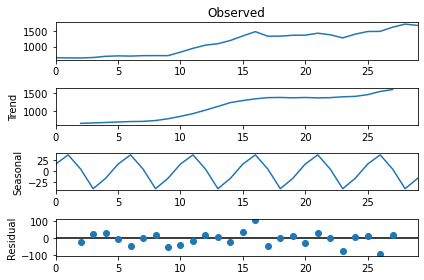

El R^2 de la tendencia es:  0.9145182039727215
Balance final de la tasa de crecimiento de la moneda USD/día [40.57401828]
El mse para el modelo es:  366329546.57823706



 
Tendencia de Market Cap para la criptomoneda bitcoin_cash


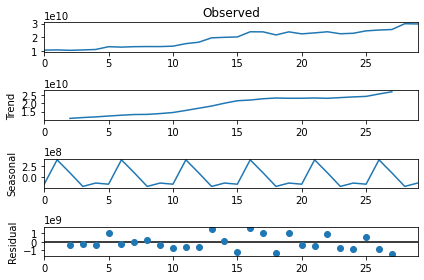

El R^2 de la tendencia es:  0.9285404092802666
Balance final de la tasa de crecimiento de la moneda USD/día [6.66591221e+08]
El mse para el modelo es:  263.45434492617346



 
Tendencia de Close para la criptomoneda bitcoin


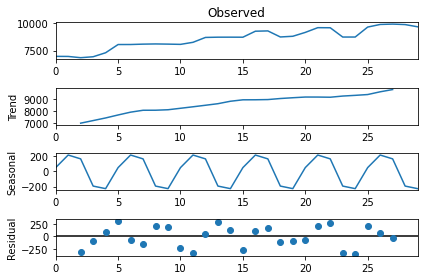

El R^2 de la tendencia es:  0.8675762970199472
Balance final de la tasa de crecimiento de la moneda USD/día [98.79114909]
El mse para el modelo es:  1513982132.5401263



 
Tendencia de Market Cap para la criptomoneda bitcoin


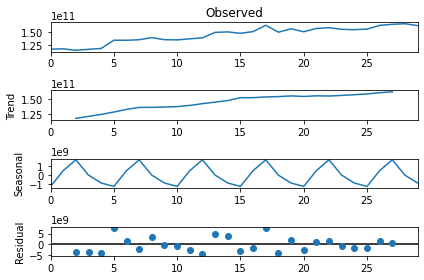

El R^2 de la tendencia es:  0.8855062301747277
Balance final de la tasa de crecimiento de la moneda USD/día [1.66281613e+09]
El mse para el modelo es:  15.80702191233584



 
Tendencia de Close para la criptomoneda dash


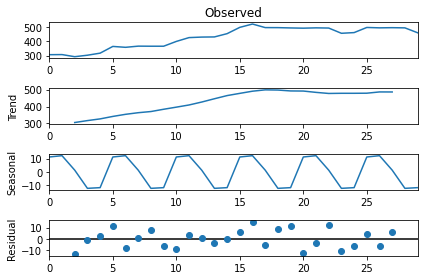

El R^2 de la tendencia es:  0.7740801635951453
Balance final de la tasa de crecimiento de la moneda USD/día [7.31641461]
El mse para el modelo es:  133986062.15582092



 
Tendencia de Market Cap para la criptomoneda dash


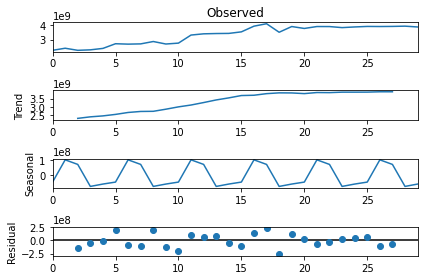

El R^2 de la tendencia es:  0.8576505221183468
Balance final de la tasa de crecimiento de la moneda USD/día [67730925.46266727]
El mse para el modelo es:  2.184348703483919



 
Tendencia de Close para la criptomoneda eos


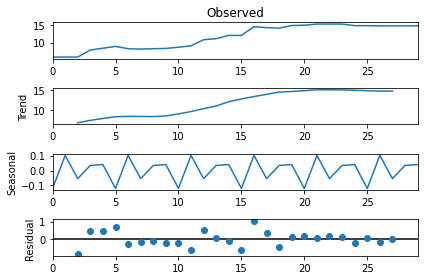

El R^2 de la tendencia es:  0.8844361356163257
Balance final de la tasa de crecimiento de la moneda USD/día [0.36261624]
El mse para el modelo es:  3696313450.997095



 
Tendencia de Market Cap para la criptomoneda eos


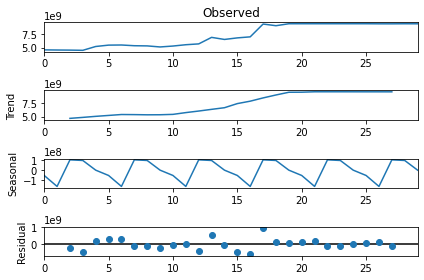

El R^2 de la tendencia es:  0.880259947892235
Balance final de la tasa de crecimiento de la moneda USD/día [2.21249229e+08]
El mse para el modelo es:  0.8476830607084023



 
Tendencia de Close para la criptomoneda ethereum_classic


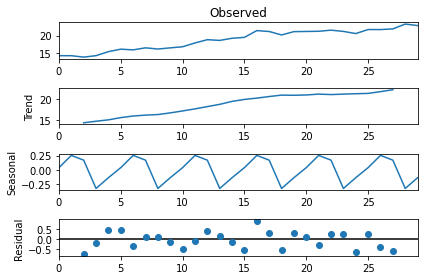

El R^2 de la tendencia es:  0.93397634805346
Balance final de la tasa de crecimiento de la moneda USD/día [0.32666748]
El mse para el modelo es:  95939971.18640827



 
Tendencia de Market Cap para la criptomoneda ethereum_classic


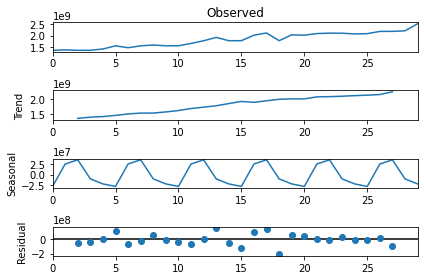

El R^2 de la tendencia es:  0.9239730431915334
Balance final de la tasa de crecimiento de la moneda USD/día [36084060.71833297]
El mse para el modelo es:  21.960113537373793



 
Tendencia de Close para la criptomoneda ethereum


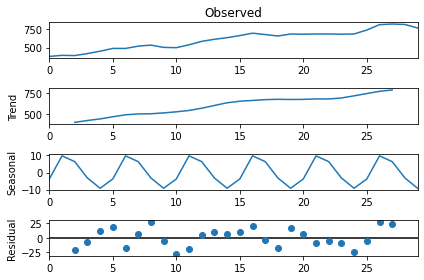

El R^2 de la tendencia es:  0.9410943671640077
Balance final de la tasa de crecimiento de la moneda USD/día [14.17575657]
El mse para el modelo es:  1161801232.0150516



 
Tendencia de Market Cap para la criptomoneda ethereum


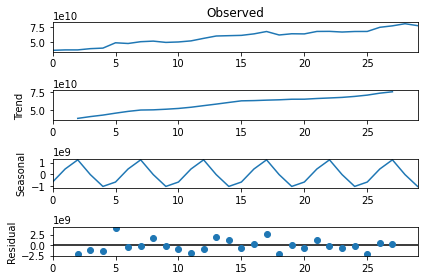

El R^2 de la tendencia es:  0.9494308708544045
Balance final de la tasa de crecimiento de la moneda USD/día [1.34712578e+09]
El mse para el modelo es:  0.08841230543926436



 
Tendencia de Close para la criptomoneda iota


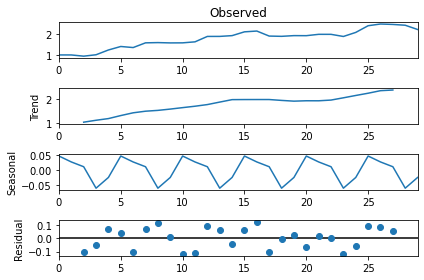

El R^2 de la tendencia es:  0.8699850317585146
Balance final de la tasa de crecimiento de la moneda USD/día [0.04696097]
El mse para el modelo es:  104728771.69508328



 
Tendencia de Market Cap para la criptomoneda iota


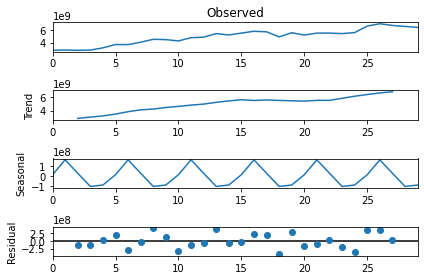

El R^2 de la tendencia es:  0.8899938186049248
Balance final de la tasa de crecimiento de la moneda USD/día [1.37159772e+08]
El mse para el modelo es:  5.157875741676067



 
Tendencia de Close para la criptomoneda litecoin


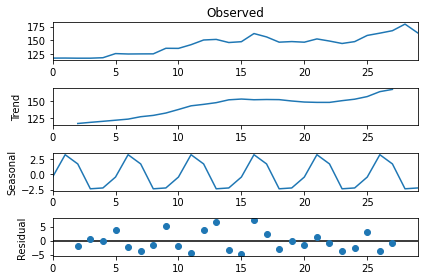

El R^2 de la tendencia es:  0.8250692557392599
Balance final de la tasa de crecimiento de la moneda USD/día [1.77505554]
El mse para el modelo es:  186110838.3803836



 
Tendencia de Market Cap para la criptomoneda litecoin


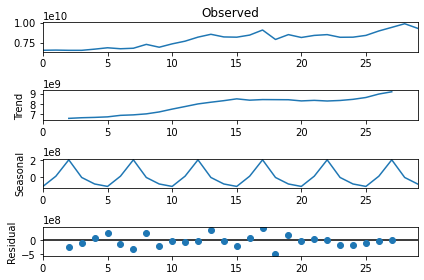

El R^2 de la tendencia es:  0.8352657091932725
Balance final de la tasa de crecimiento de la moneda USD/día [1.00021628e+08]
El mse para el modelo es:  0.4244746260910745



 
Tendencia de Close para la criptomoneda nano


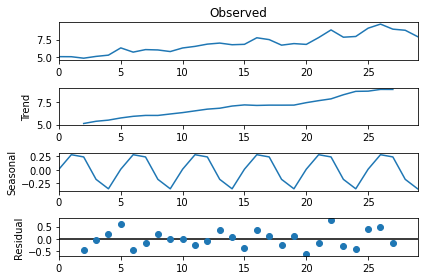

El R^2 de la tendencia es:  0.858786752832671
Balance final de la tasa de crecimiento de la moneda USD/día [0.13826171]
El mse para el modelo es:  26132403.035308167



 
Tendencia de Market Cap para la criptomoneda nano


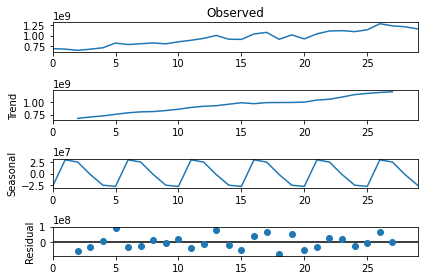

El R^2 de la tendencia es:  0.9098716158994732
Balance final de la tasa de crecimiento de la moneda USD/día [19892345.90666629]
El mse para el modelo es:  2.7390550212002793



 
Tendencia de Close para la criptomoneda neo


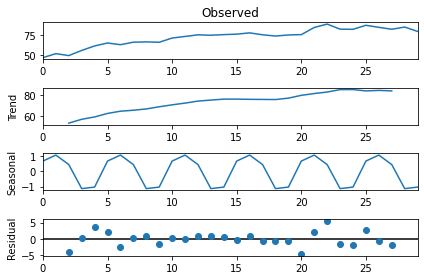

El R^2 de la tendencia es:  0.8425552686683608
Balance final de la tasa de crecimiento de la moneda USD/día [1.17322318]
El mse para el modelo es:  71334892.1782827



 
Tendencia de Market Cap para la criptomoneda neo


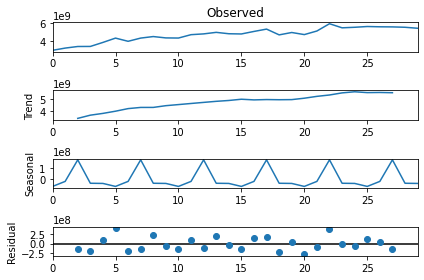

El R^2 de la tendencia es:  0.8534044216486327
Balance final de la tasa de crecimiento de la moneda USD/día [80743099.18516894]
El mse para el modelo es:  0.032453852978238405



 
Tendencia de Close para la criptomoneda ripple


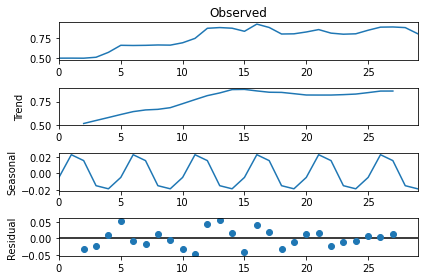

El R^2 de la tendencia es:  0.6818773068071597
Balance final de la tasa de crecimiento de la moneda USD/día [0.01274511]
El mse para el modelo es:  568564703.7334272



 
Tendencia de Market Cap para la criptomoneda ripple


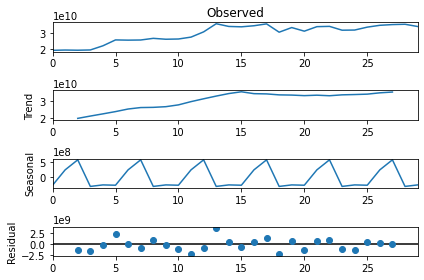

El R^2 de la tendencia es:  0.753557378085041
Balance final de la tasa de crecimiento de la moneda USD/día [5.57684975e+08]
El mse para el modelo es:  0.01626482950295426



 
Tendencia de Close para la criptomoneda stellar


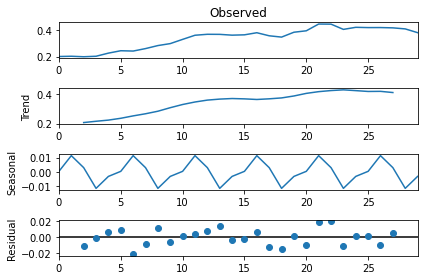

El R^2 de la tendencia es:  0.842325958775228
Balance final de la tasa de crecimiento de la moneda USD/día [0.00849145]
El mse para el modelo es:  96836677.61998877



 
Tendencia de Market Cap para la criptomoneda stellar


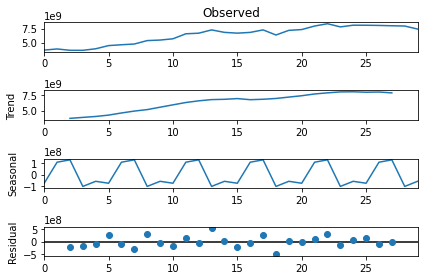

El R^2 de la tendencia es:  0.8793653243070827
Balance final de la tasa de crecimiento de la moneda USD/día [1.69415427e+08]
El mse para el modelo es:  0.004007891646943563



 
Tendencia de Close para la criptomoneda tron


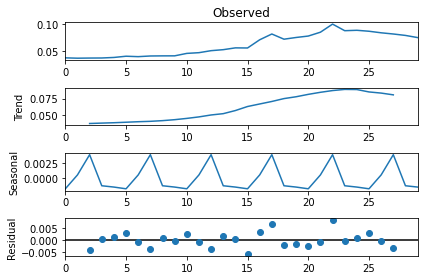

El R^2 de la tendencia es:  0.8430992043643522
Balance final de la tasa de crecimiento de la moneda USD/día [0.00215877]
El mse para el modelo es:  98600200.48810057



 
Tendencia de Market Cap para la criptomoneda tron


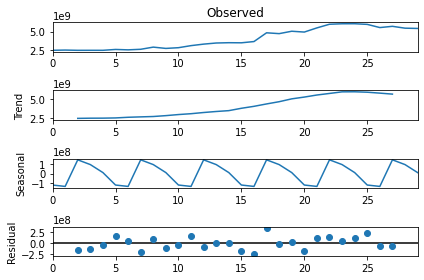

El R^2 de la tendencia es:  0.8886386157764266
Balance final de la tasa de crecimiento de la moneda USD/día [1.50663326e+08]
El mse para el modelo es:  0.005659916427000688



 
Tendencia de Close para la criptomoneda verge


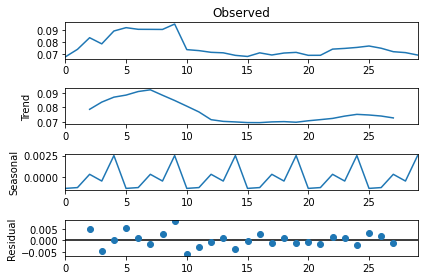

El R^2 de la tendencia es:  0.24165412303812697
Balance final de la tasa de crecimiento de la moneda USD/día [-0.00048026]
El mse para el modelo es:  24817253.007054277



 
Tendencia de Market Cap para la criptomoneda verge


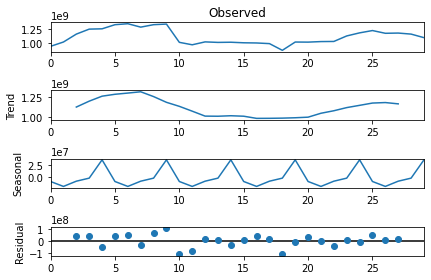

El R^2 de la tendencia es:  0.031761132953406435
Balance final de la tasa de crecimiento de la moneda USD/día [-2631501.85581498]


In [19]:
columnas= ['Close', 'Market Cap']
top= pd.DataFrame(columns=['Cripto Moneda','Tasa tend Close ', 'Variacion final Close(%)', 'Tasa tend Market Cap',
                           'Variacion final Market Cap (%)'])
c=0
for i in nombres:
    l=[i]
    for j in columnas:
        prom_hist, ultimo= graficar(i, j, model)
        tend=grafica_tendencias(i, j, model)
        l.append(tend[0])
        l.append(round((ultimo-prom_hist)/prom_hist*100,2))
    top.loc[c] = l
    c+=1

In [20]:
top

,Cripto Moneda,Tasa tend Close,Variacion final Close(%),Tasa tend Market Cap,Variacion final Market Cap (%)
0,bitcoin_cash,40.574018,55.08,6.665912e+08,64.50
1,bitcoin,98.791149,476.85,1.662816e+09,497.21
2,dash,7.316415,336.76,6.773093e+07,384.35
3,eos,0.362616,219.38,2.212492e+08,249.04
4,ethereum_classic,0.326667,98.47,3.608406e+07,127.50
5,ethereum,14.175757,346.18,1.347126e+09,371.51
6,iota,0.046961,61.87,1.371598e+08,70.25
7,litecoin,1.775056,572.85,1.000216e+08,660.65
8,nano,0.138262,103.65,1.989235e+07,125.40
9,neo,1.173223,190.77,8.074310e+07,217.08


# Análisis 

**Bitcoin cash (No exitosa)** 

>Para Bitcoin cash, se pronostica un crecimiento de 40 USD por día, medido a 30 días, esto habla de un buen crecimiento de la moneda, obteniendo un 55% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Lamentablemente, no puede ser considerada una moneda no exitosa, ya que no cumple los requisitos de duplicar su porcentaje de variación final en el precio y mercado.

**Bitcoin (Exitosa)** 

>Para Bitcoin, se pronostica un crecimiento de 98 USD por día, medido a 30 días, esto habla de un excelente crecimiento de la moneda, obteniendo un 476% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Así esta puede ser considerada una moneda exitosa, ya que claramente su precio y mercado van al alza.

**Dash (Exitosa)** 

>Para Dash, se pronostica un crecimiento de 7 USD por día, medido a 30 días, esto habla de un excelente crecimiento de la moneda, obteniendo un 336% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Así esta puede ser considerada una moneda exitosa, ya que claramente su precio y mercado van al alza.

**Eos (Exitosa)** 

>Para Eos, se pronostica un crecimiento de 0.36 USD por día, medido a 30 días, esto habla de un crecimiento moderado de la moneda, obteniendo un 219% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Así esta puede ser considerada una moneda exitosa, ya que claramente su precio y mercado van al alza.

**Ethereum classic (No exitosa)** 

>Para Ethereum classic, se pronostica un crecimiento de 0.33 USD por día, medido a 30 días, esto habla de un cremimiento moderado de la moneda, obteniendo un 98% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Lamentablemente, no puede ser considerada una moneda no exitosa, ya que no cumple los requisitos de duplicar su porcentaje de variación final en el precio y mercado.

**Ethereum (Exitosa)** 

>Para Ethereum, se pronostica un crecimiento de 14 USD por día, medido a 30 días, esto habla de un excelente crecimiento de la moneda, obteniendo un 346% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Así esta puede ser considerada una moneda exitosa, ya que claramente su precio y mercado van al alza.

**Iota (No exitosa)** 

>Para Iota, se pronostica un crecimiento de 0.05 USD por día, medido a 30 días, esto habla de un crecimiento modesto de la moneda, obteniendo un 61% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Lamentablemente, no puede ser considerada una moneda no exitosa, ya que no cumple los requisitos de duplicar su porcentaje de variación final en el precio y mercado.

**Litecoin (Exitosa)** 

>Para Litecoin, se pronostica un crecimiento de 1.7 USD por día, medido a 30 días, esto habla de un buen crecimiento de la moneda, obteniendo un 572% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Así esta puede ser considerada una moneda exitosa, ya que claramente su precio y mercado van al alza.

**Nano (No exitosa)** 

>Para Nano, se pronostica un crecimiento de 0.14 USD por día, medido a 30 días, esto habla de un crecimiento modesto de la moneda, obteniendo un 103% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Lamentablemente, no puede ser considerada una moneda no exitosa, ya que no cumple los requisitos de tener una tendencia al alza realmente buena en su precio. 

**Neo (Exitosa)** 

>Para Neo, se pronostica un crecimiento de 1.1 USD por día, medido a 30 días, esto habla de un buen crecimiento de la moneda, obteniendo un 190% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Así esta puede ser considerada una moneda exitosa, ya que claramente su precio y mercado van al alza.

**Ripple (Exitosa)** 

>Para Ripple, se pronostica un crecimiento de 0.01 USD por día, medido a 30 días, esto habla de un crecimiento modesto de la moneda, pero obteniendo un 590% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Así esta puede ser considerada una moneda exitosa, a pesar de su bajo crecimiento, pues esta moneda indica un alza muy prometedor en su precio con respecto al valor promedio histórico.

**Stellar (Exitosa)** 

>Para Stellar, se pronostica un crecimiento de 0.01 USD por día, medido a 30 días, esto habla de un crecimiento modesto de la moneda, pero obteniendo un 856% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Así esta puede ser considerada una moneda exitosa, a pesar de su bajo crecimiento, pues esta moneda indica un alza muy prometedor en su precio con respecto al valor promedio histórico.

**Tron (No exitosa)** 

>Para Tron, se pronostica un crecimiento de 0.002 USD por día, medido a 30 días, esto habla de un crecimiento modesto de la moneda, obteniendo un 132% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Lamentablemente, no puede ser considerada una moneda no exitosa, ya que no cumple los requisitos de tener una tendencia al alza realmente buena en su precio. 

**Tron (No exitosa)** 

>Para Tron, se pronostica un decrecimiento de 0.0005 USD por día, medido a 30 días, esto habla de un nulo crecimiento de la moneda, incluso tendiendo a la baja. Sin embargo, obtiene un 724% de alza con respecto a su precio promedio histórico. Análogamente para el mercado. Lamentablemente, su buena situación actual, no refleja un éxito a futuro, pues se espera que la moneda se deprecie en el tiempo. 